# Klasyfikacja gwiazd - EDA - *walidacja*

### Pakiety

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

In [36]:
# wczytanie danych
df = pd.read_csv('validation_data.csv')

### Ad 1. Cel biznesowy
*Celem biznesowym zadania jest klasyfikacja typów gwiazdozbiorów.*
Cel biznesowy został określony poprawnie, chociaż dodałabym, że chodzi o **zbudowanie modelu**, który będzie klasyfikował typy gwiazdozbiorów.


### 2. Dane
### Ad 2.1. Podział danych na zbiór treningowy i testowy

In [37]:
# wczytanie danych
df = pd.read_csv('validation_data.csv') # wczytuję dane walidacyjne

# podział danych na zbiór treningowy i testowy
train_df, test_df = train_test_split(df, test_size=0.3, random_state=42)

# reset indeksów
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

In [38]:
train_df.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237664e+18,349.495610,-0.652291,22.62598,22.27101,22.10297,21.48157,21.44546,4263,301,2,45,9.867511e+18,GALAXY,0.856151,8764,57332,451
1,1.237654e+18,123.537903,43.645638,23.96375,22.17757,20.27680,19.51148,18.75158,2076,301,5,136,7.180996e+18,GALAXY,0.481229,6378,56330,24
2,1.237659e+18,232.268431,48.932729,19.46281,18.28256,17.63925,17.27675,17.07799,3225,301,2,143,1.314024e+18,GALAXY,0.140941,1167,52738,359
3,1.237662e+18,257.135627,21.555576,21.73050,21.12053,20.52096,20.90219,20.54848,3918,301,3,422,4.699568e+18,QSO,1.110184,4174,55659,225
4,1.237658e+18,189.119498,59.331951,22.23572,20.27739,19.95065,19.95797,20.06435,2989,301,2,56,9.271963e+18,QSO,3.075445,8235,58191,643


In [39]:
test_df.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237662e+18,172.754960,7.116178,25.88038,22.27442,20.30214,19.42000,18.97915,3841,301,3,53,6.050669e+18,GALAXY,0.489321,5374,55947,303
1,1.237668e+18,219.107869,18.720969,21.29440,20.55792,20.40480,20.25589,20.18878,5183,301,3,563,6.641755e+18,QSO,2.717779,5899,56038,260
2,1.237668e+18,183.896711,18.784784,20.26995,18.28788,17.05681,16.55653,16.18780,5314,301,1,49,2.938656e+18,GALAXY,0.180268,2610,54476,209
3,1.237666e+18,14.070919,-0.953293,19.52753,17.37629,16.26569,15.81869,15.46251,4858,301,1,448,4.447860e+17,GALAXY,0.140214,395,51783,202
4,1.237671e+18,181.453187,11.171469,18.69988,17.39397,16.84388,16.64397,16.51726,5973,301,6,157,3.618689e+18,STAR,-0.000418,3214,54866,168


### Ad 2.3. Podstawowe informacje o danych
Wczytanie danych przebiegło poprawnie. Typy danych również zostały sklasyfikowane poprawnie.

In [40]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21000 entries, 0 to 20999
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   obj_ID       21000 non-null  float64
 1   alpha        21000 non-null  float64
 2   delta        21000 non-null  float64
 3   u            21000 non-null  float64
 4   g            21000 non-null  float64
 5   r            21000 non-null  float64
 6   i            21000 non-null  float64
 7   z            21000 non-null  float64
 8   run_ID       21000 non-null  int64  
 9   rerun_ID     21000 non-null  int64  
 10  cam_col      21000 non-null  int64  
 11  field_ID     21000 non-null  int64  
 12  spec_obj_ID  21000 non-null  float64
 13  class        21000 non-null  object 
 14  redshift     21000 non-null  float64
 15  plate        21000 non-null  int64  
 16  MJD          21000 non-null  int64  
 17  fiber_ID     21000 non-null  int64  
dtypes: float64(10), int64(7), object(1)
memory usa

Można by jeszcze sprawdzić, czy nie mamy brakujących wartości w postaci zer:

In [41]:
# sprawdzenie, czy nie mamy brakujących wartości w postaci zer
train_df_num = train_df.drop('class',axis=1)
zero_columns = train_df_num.columns[(train_df_num.abs() < 1e-10).mean() > 0.5]

# Print or use the identified columns
print("Columns with majority of values close to 0:")
print(zero_columns)

Columns with majority of values close to 0:
Index([], dtype='object')


In [42]:
train_df.describe()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,redshift,plate,MJD,fiber_ID
count,2.100000e+04,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.0,21000.000000,21000.000000,2.100000e+04,21000.000000,21000.000000,21000.000000,21000.000000
mean,1.237665e+18,177.303463,24.089247,22.075549,20.644750,19.657043,19.098165,18.780577,4496.817095,301.0,3.514143,187.518762,5.811134e+18,0.575022,5161.213667,55607.287095,449.389429
std,8.480875e+12,97.154059,19.597139,2.239639,2.036525,1.849018,1.756080,1.764112,1974.616252,0.0,1.583792,149.740493,3.317086e+18,0.721831,2946.148207,1805.438898,272.165644
min,1.237646e+18,0.022966,-17.284791,12.262400,10.511390,10.068540,11.263940,10.225510,109.000000,301.0,1.000000,11.000000,2.995191e+17,-0.004255,266.000000,51609.000000,1.000000
25%,1.237659e+18,126.513928,4.923376,20.357843,18.983173,18.154612,17.754955,17.500547,3187.000000,301.0,2.000000,83.000000,2.876147e+18,0.057188,2554.500000,54274.250000,220.000000
50%,1.237663e+18,181.098998,23.641597,22.173890,21.121730,20.134190,19.409375,19.008170,4192.000000,301.0,4.000000,147.000000,5.633545e+18,0.427954,5003.500000,55893.000000,433.000000
75%,1.237669e+18,233.912689,39.882582,23.660355,22.128975,21.060805,20.409935,19.921973,5362.000000,301.0,5.000000,243.000000,8.345283e+18,0.706502,7412.000000,56804.000000,644.000000
max,1.237681e+18,359.999810,83.000519,29.234380,31.602240,27.397090,30.154600,25.221840,8162.000000,301.0,6.000000,989.000000,1.412685e+19,7.011245,12547.000000,58932.000000,1000.000000


In [43]:
train_df.nunique()

obj_ID         19694
alpha          21000
delta          21000
u              20672
g              20663
r              20611
i              20641
z              20562
run_ID           404
rerun_ID           1
cam_col            6
field_ID         800
spec_obj_ID    21000
class              3
redshift       20900
plate           5400
MJD             2078
fiber_ID        1000
dtype: int64

*Wnioski:*  
- *Dane w kolumnach 'cam_col' i 'rerun_ID' możemy traktować jako zmienne typu dyskretnego, natomiast pozostałe - jako ciągłego.*  
- *Zmienna 'rerun_ID' **nie ma żadnego znaczenia** w projekcie. Podobnie 'cam_col' nie mówi nam nic o danych.*
- *Dane o nazwach [coś]_ID nie mają znaczenia dla identyfikacji gwiazd.*

Wnioski dobre, zastanawiam się tylko, czy kolumna 'spec_obj_ID' na pewno nie ma znaczenia przy identyfikacji klas? Opis wskazuje, jakby mogła mieć wpływ.

### 2.4. Target
*Badamy liczbę występowań różnych wartości w kolumnie 'class', w której mamy 3 możliwe wartości: GALAXY, STAR i QSO.*

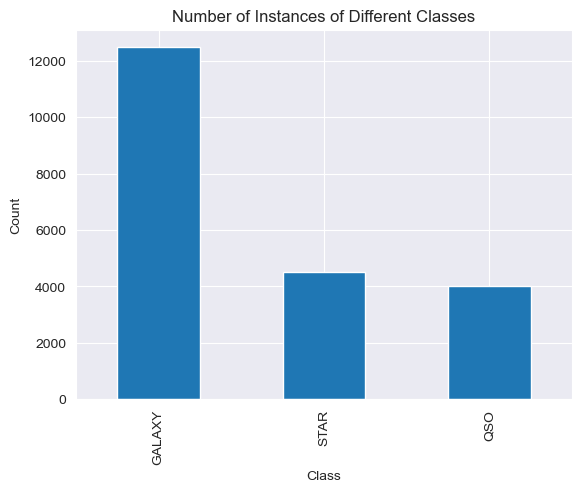

In [44]:
train_df['class'].value_counts().plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Number of Instances of Different Classes')
plt.show()

In [45]:
s = train_df.shape[0]

print("Procent wystąpień klasy GALAXY: " + str(train_df['class'].value_counts()[0]/s*100))
print("Procent wystąpień klasy QSO: " + str(train_df['class'].value_counts()[1]/s*100))
print("Procent wystąpień klasy STAR: " + str(train_df['class'].value_counts()[2]/s*100))

Procent wystąpień klasy GALAXY: 59.41428571428572
Procent wystąpień klasy QSO: 21.45714285714286
Procent wystąpień klasy STAR: 19.128571428571426


C:\Users\pauli\AppData\Local\Temp\ipykernel_15216\1241183781.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print("Procent wystąpień klasy GALAXY: " + str(train_df['class'].value_counts()[0]/s*100))
C:\Users\pauli\AppData\Local\Temp\ipykernel_15216\1241183781.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print("Procent wystąpień klasy QSO: " + str(train_df['class'].value_counts()[1]/s*100))
C:\Users\pauli\AppData\Local\Temp\ipykernel_15216\1241183781.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consiste

W porządku, działa. Proporcje wystąpień obiektów danych klas analogiczne jak dla danych zespołu budowy.

### 3. Eksploracja

### Ad 3.1. Rozkłady poszczególnych zmiennych

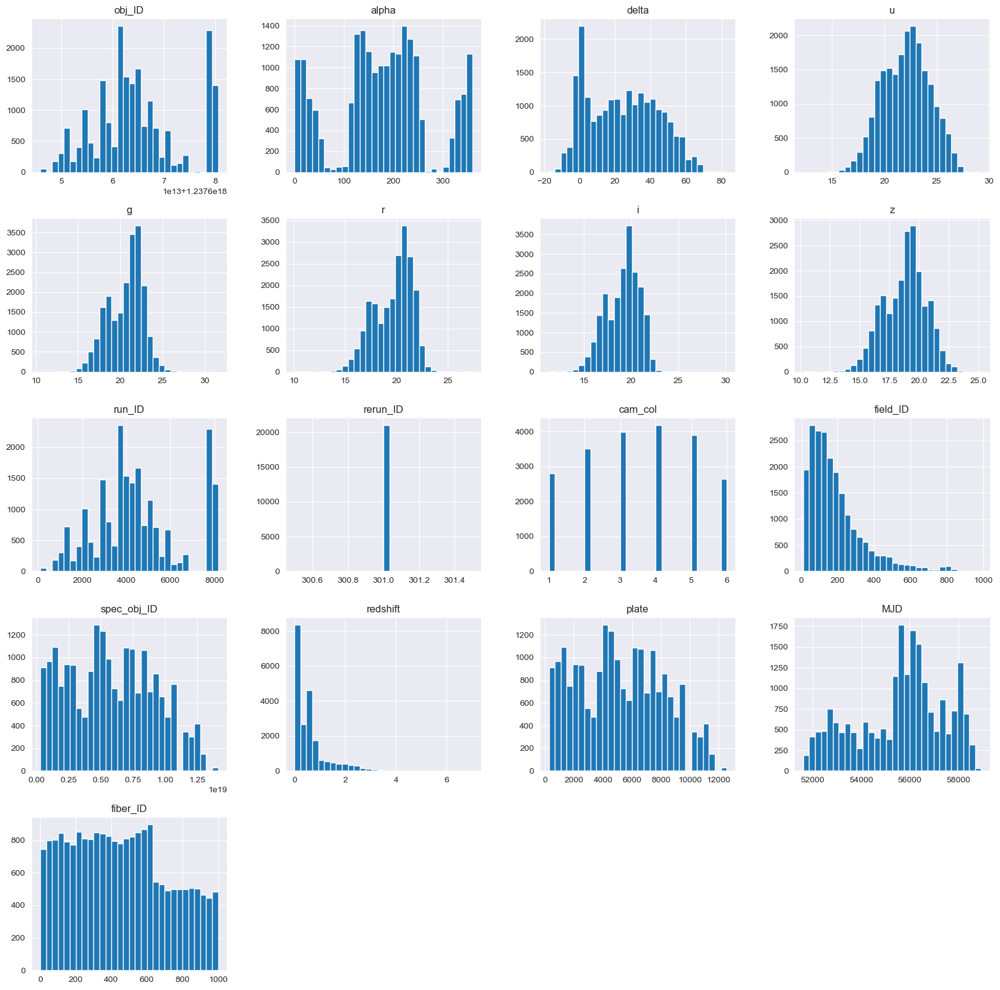

In [46]:
train_df.hist(bins=30, figsize=(20,20))
plt.show()

_Obserwacje:_
- *Zmienna u (= Filtr ultrafioletowy w systemie fotometrycznym) ma rozkład podobny do normalnego,*
- *Zmienna field_ID (= numer pola do identyfikacji każdego pola) ma rozkład podobny do wykładniczego,*
- *Dla zmiennej fiber_ID (= identyfikator włókna identyfikujący włókno, które skierowało światło na płaszczyznę ogniskową w każdej obserwacji) wartości są równomiernie rozrzucone.*


Obserwacje poprawne, dla danych walidacyjnych otrzymaliśmy podobne wyniki.

## Przegląd wizualizacji

### 3.2. Zależności między wybranymi dwiema zmiennymi numerycznymi

#### Ad 3.2.1. Korelacja Pearsona

In [47]:
# heatmapa korelacji Pearsona między zmiennymi
plt.figure(figsize=(12, 10))
sns.heatmap(train_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Pearson Correlation Matrix for df variables")
plt.show()

ValueError: could not convert string to float: 'GALAXY'

<Figure size 1200x1000 with 0 Axes>

Tu coś nie zadziałało.

#### Ad 3.2.2. Korelacja Spearmana

In [48]:
plt.figure(figsize=(12,10))
sns.heatmap(train_df.corr(method='spearman'), annot=True, cmap='coolwarm')
plt.title("Spearman Correlation Matrix")
plt.show()

ValueError: could not convert string to float: 'GALAXY'

<Figure size 1200x1000 with 0 Axes>

Tak samo jak wyżej.

#### Ad 3.2.3. Rozkład obiektów na sferze niebieskiej

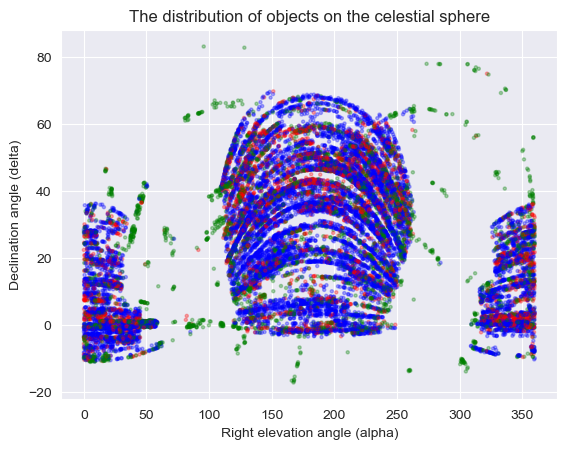

In [49]:
class_colors = {"QSO": "red", "GALAXY": "blue", "STAR": "green"}

plt.scatter(x = train_df["alpha"], y = train_df["delta"], s = 5, alpha = 0.3, c = train_df["class"].map(class_colors))

plt.title("The distribution of objects on the celestial sphere")
plt.xlabel("Right elevation angle (alpha)")
plt.ylabel("Declination angle (delta)")
plt.show()

# czemu to wyglada inaczej
# class_colors = {'QSO': 'red', 'GALAXY': 'blue', 'STAR': 'green'}

# # Create an empty plot
# fig, ax = plt.subplots()

# # Plot each class separately with its respective color
# for class_label, color in class_colors.items():
#     class_data = train_df[train_df["class"] == class_label]
#     ax.scatter(x =c lass_data["alpha"], y =class_data["delta"], s = 5, alpha = 0.3, color = color, label =c lass_label)

# plt.title("The distribution of objects on the celestial sphere")
# plt.xlabel("Right elevation angle (alpha)")
# plt.ylabel("Declination angle (delta)")
# plt.legend(title="Class")
# plt.show()

Otrzymany wykres zbliżony do otrzymanego przez zespół budowy.

#### Ad 3.2.4. Zależność przesunięcia lu czerwieni od czasu

Text(0, 0.5, 'Redshift value')

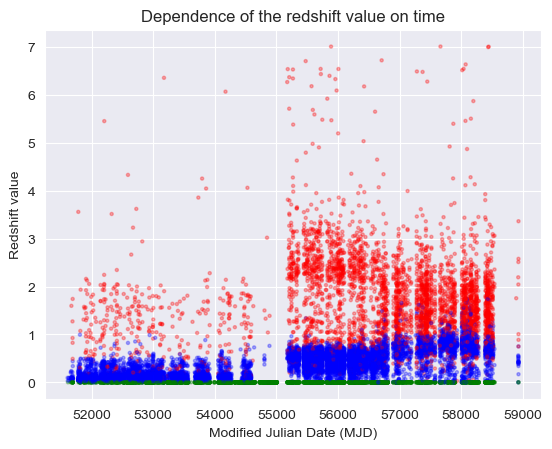

In [50]:
# train_df.plot.scatter(x = "MJD", y = "redshift", s = 5, alpha = 0.3)
class_colors = {"QSO": "red", "GALAXY": "blue", "STAR": "green"}
plt.scatter(x = train_df["MJD"], y = train_df["redshift"], s = 5, alpha = 0.3, c = train_df["class"].map(class_colors))
plt.title("Dependence of the redshift value on time")
plt.xlabel("Modified Julian Date (MJD)")
plt.ylabel("Redshift value")

Otrzymany wykres zbliżony do otrzymanego przez zespół budowy.

#### Ad 3.2.5. Zależność przesunięcia ku czerwieni od tablicy

Text(0, 0.5, 'Redshift value')

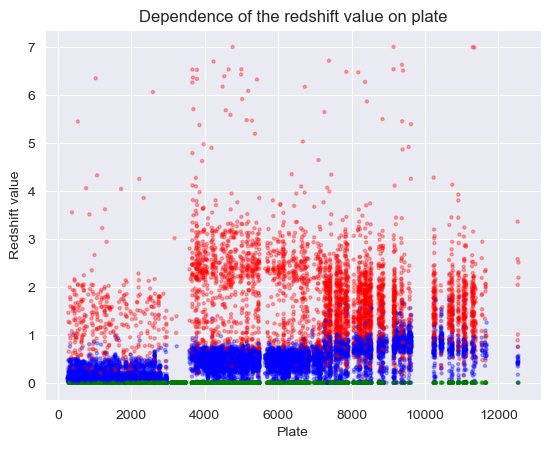

In [51]:
# train_df.plot.scatter(x = "plate", y = "redshift", s = 5, alpha = 0.3)
class_colors = {"QSO": "red", "GALAXY": "blue", "STAR": "green"}
plt.scatter(x = train_df["plate"], y = train_df["redshift"], s = 5, alpha = 0.3, c = train_df["class"].map(class_colors))
plt.title("Dependence of the redshift value on plate")
plt.xlabel("Plate")
plt.ylabel("Redshift value")


Otrzymany wykres zbliżony do otrzymanego przez zespół budowy.

### 3.3. Zależność między zmiennymi dyskretnymi

#### Ad 3.3.1. Rozkład klasy obiektu w zależności od cam_col


<Figure size 1000x600 with 0 Axes>

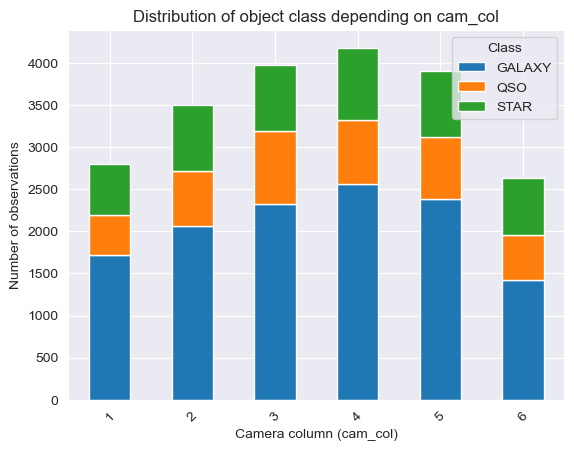

In [52]:
plt.figure(figsize = (10, 6))
train_df.groupby(["cam_col", "class"]).size().unstack().plot(kind = "bar", stacked = True)
plt.title("Distribution of object class depending on cam_col")
plt.xlabel("Camera column (cam_col)")
plt.ylabel("Number of observations")
plt.legend(title = "Class")
plt.xticks(rotation = 45)
plt.show()

Wyniki zbliżone do tych otrzymanych przez zespół budowy.

#### Ad 3.3.2. Rozkład klasy 'class' od 'plate'

ValueError: 'locs' must be 1D with shape (N,), but your input has shape ()

<Figure size 1000x600 with 0 Axes>

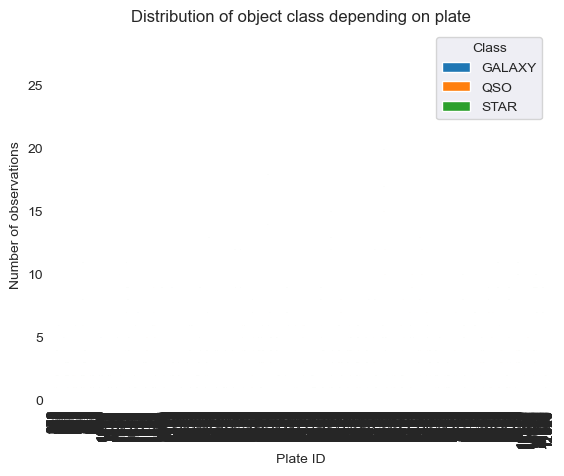

In [23]:
# plt.figure(figsize = (10, 6))
# train_df.groupby(["plate", "class"]).size().unstack().plot(kind = "bar", stacked = True)
# plt.title("Distribution of object class depending on plate")
# plt.xlabel("Plate ID")
# plt.ylabel("Number of observations")
# plt.legend(title = "Class")
# plt.xticks(45)
# plt.show() 

<span style="color:red;">*Ten wykres sie strasznie dlugo ładuje, a jeśli juz sie załaduje, to jest nieczytelny.*</span>
Dla danych walidacyjnych podobnie. Załadował się (po długim czasie i mimo błędu), ale nieczytelny.

#### Ad 3.3.3. Rozkład klas

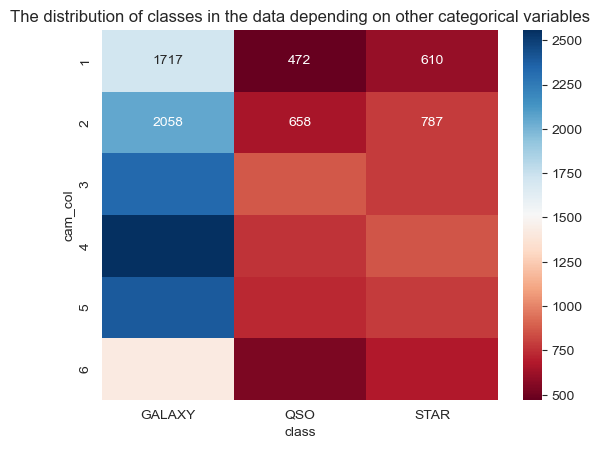

In [53]:
#class_distribution = train_df.groupby(["plate", "cam_col", "field_ID"])["class"].value_counts().unstack()
class_distribution = train_df.groupby(["cam_col"])["class"].value_counts().unstack()

# wypełnienie wartości NaN i inf zerami
class_distribution.replace([np.inf, -np.inf], np.nan, inplace=True)
class_distribution.fillna(0, inplace=True)

class_distribution = class_distribution.round().astype(int)
sns.heatmap(class_distribution, annot = True, cmap = "RdBu", fmt = "d")
plt.title("The distribution of classes in the data depending on other categorical variables")
plt.show()

Rozkład kolorów podobny, z jakiegoś powodu załadowały mi się wartości liczbowe tylko w dwóch pierwszych wierszach.

### Ad 3.4. Korelacje między zmiennymi numerycznymi

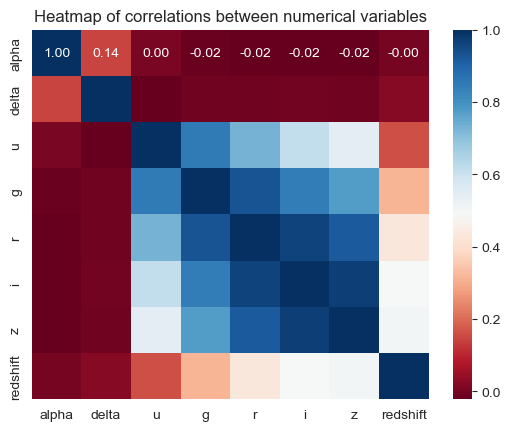

In [54]:
numerical_columns = ["alpha", "delta", "u", "g", "r", "i", "z", "redshift"]
corr = train_df[numerical_columns].corr()   # korelacje między zmiennymi
sns.heatmap(corr, annot = True, cmap = "RdBu", fmt = ".2f")
plt.title("Heatmap of correlations between numerical variables")
plt.show()

Rozkład kolorów podobny, z jakiegoś powodu załadowały mi się wartości liczbowe tylko w pierwszym wierszu. Wnioski wydają się być poprawne.

### Ad 3.5. Średnie wartości zmiennych numerycznych

Text(0.5, 1.0, 'Average value of numerical variables in different classes')

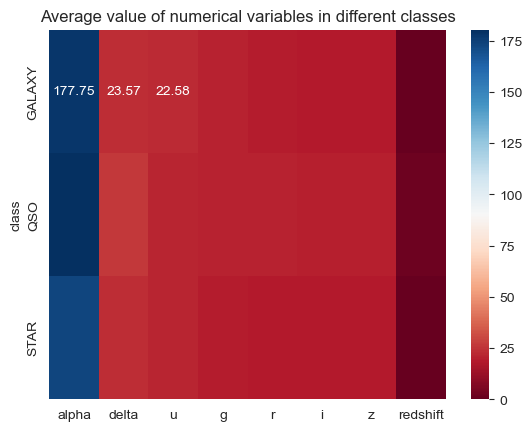

In [55]:
numeric_mean_by_class = train_df.groupby("class")[numerical_columns].mean()
sns.heatmap(numeric_mean_by_class, annot = True, cmap = "RdBu", fmt = ".2f")
plt.title("Average value of numerical variables in different classes")

Rozkład kolorystyczny podobny, nie ładują mi się wszystkie wartości liczbowe.

### 3.6. Rozkład zmiennych numerycznych w zalezności od klasy

#### Ad 3.6.1. rozkład redshift

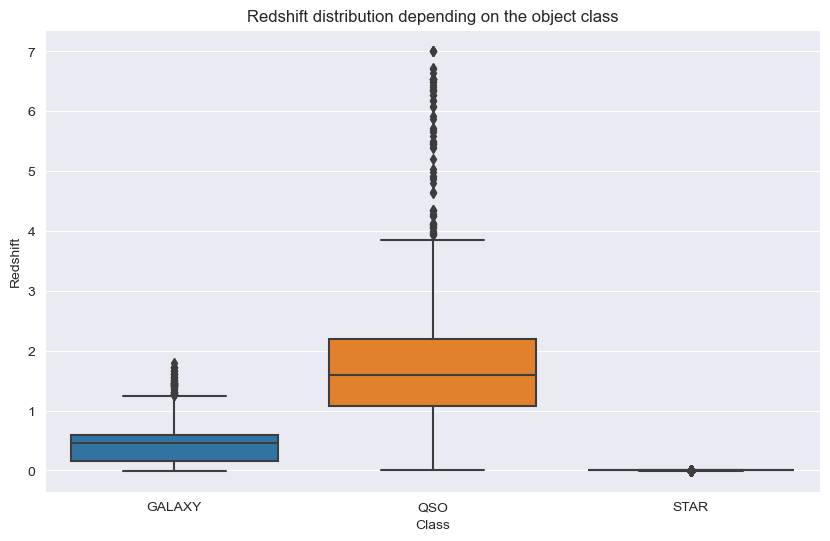

In [56]:
plt.figure(figsize = (10, 6))
sns.boxplot(x = "class", y = "redshift", data = train_df)
plt.title("Redshift distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("Redshift")
plt.show()

Wykresy zbliżone. Skąd wniosek? (może ja po prostu nie rozumiem tego wykresu, w sensie jak on świadczy o korelacji).

#### Ad 3.6.2. rozkład plate


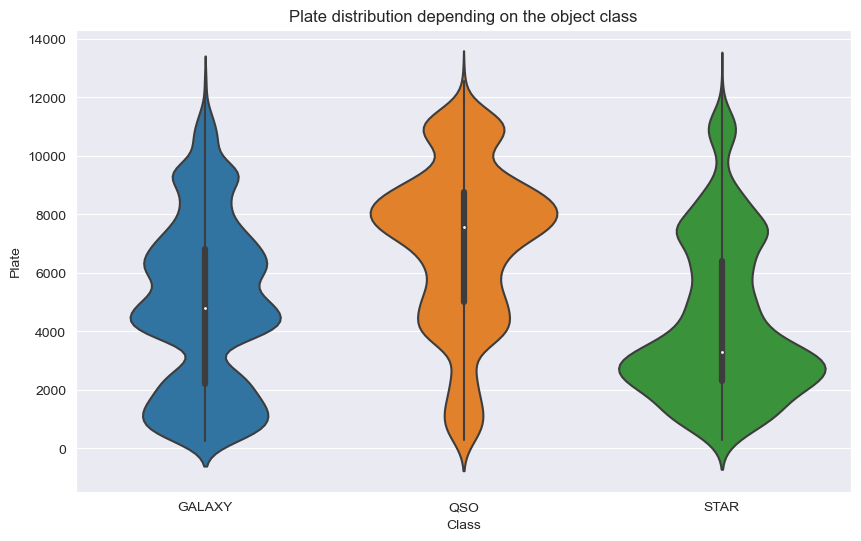

In [28]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "plate", data = train_df)
plt.title("Plate distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("Plate")
plt.show()

Wyniki podobne.

#### Ad 3.6.3. rozkład MJD 


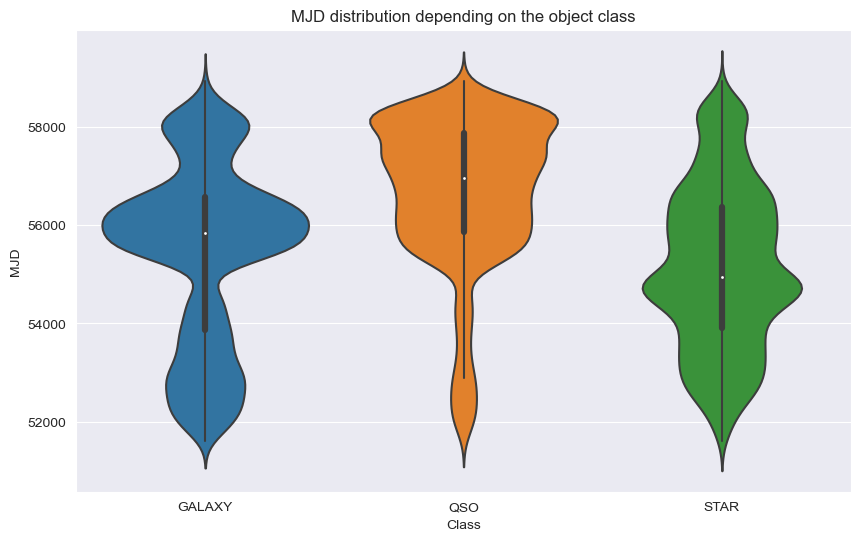

In [29]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "MJD", data = train_df)
plt.title("MJD distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("MJD")
plt.show()

Wyniki zbliżone.

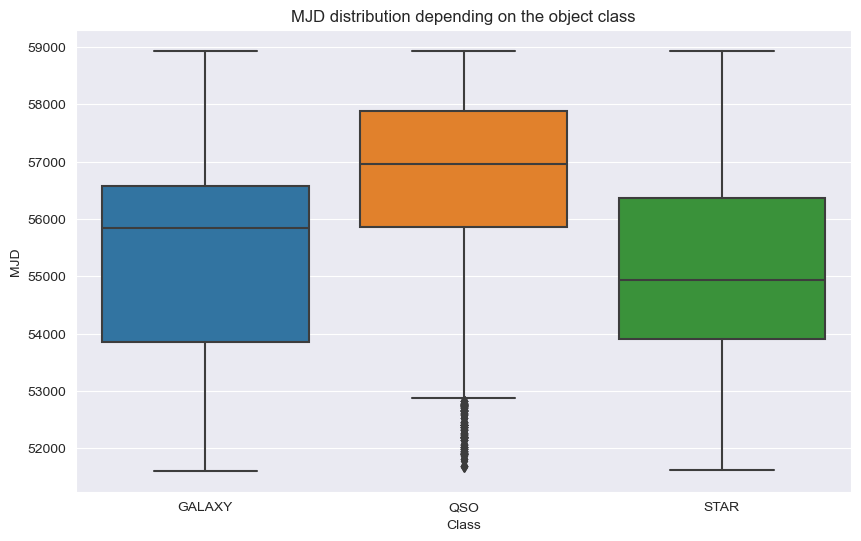

In [30]:
plt.figure(figsize = (10, 6))
sns.boxplot(x = "class", y = "MJD", data = train_df)
plt.title("MJD distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("MJD")
plt.show()

Wyniki podobne jak dla zespołu budowy.

#### Ad 3.6.3. rozkład alpha
Numeracja przesunięta - ale to drobny szczegół;)

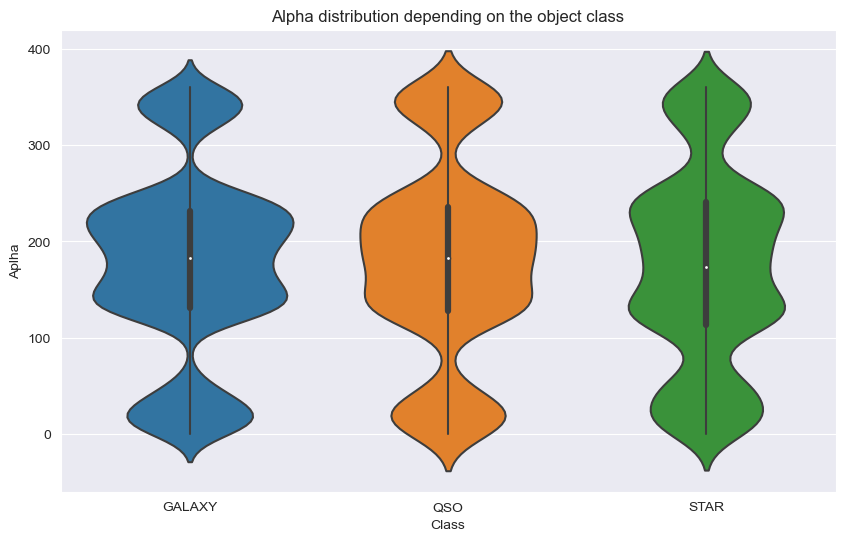

In [31]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "alpha", data = train_df)
plt.title("Alpha distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("Aplha")
plt.show()

Wyniki podobne.

#### Ad 3.6.4. rozkład delta


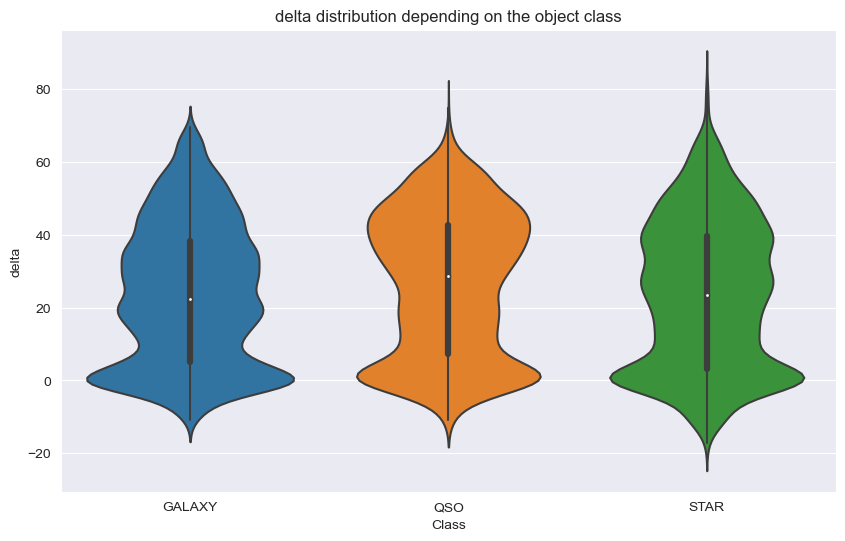

In [32]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "delta", data = train_df)
plt.title("delta distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("delta")
plt.show()

Jak wyżej.

#### Ad 3.6.5 rozkład u

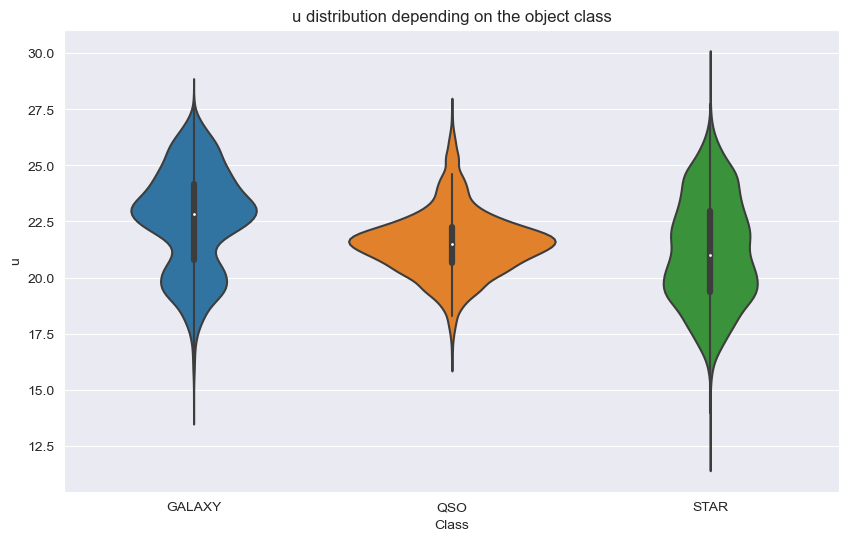

In [33]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "u", data = train_df)
plt.title("u distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("u")
plt.show()

Jak wyżej.

*Wniosek: QSO ma dużo wartości u~=21, podczas gdy GALAXY ma ich bardzo mało.*
Wniosek dla danych walidacyjnych podobny.

#### Ad 3.6.6. rozkład g


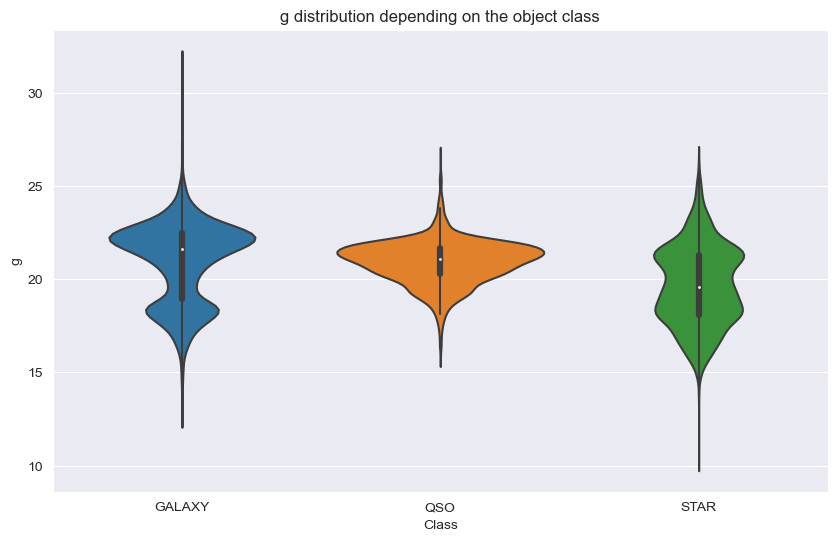

In [57]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "g", data = train_df)
plt.title("g distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("g")
plt.show()

Wyniki zbliżone.

#### Ad 3.6.7. rozkład r


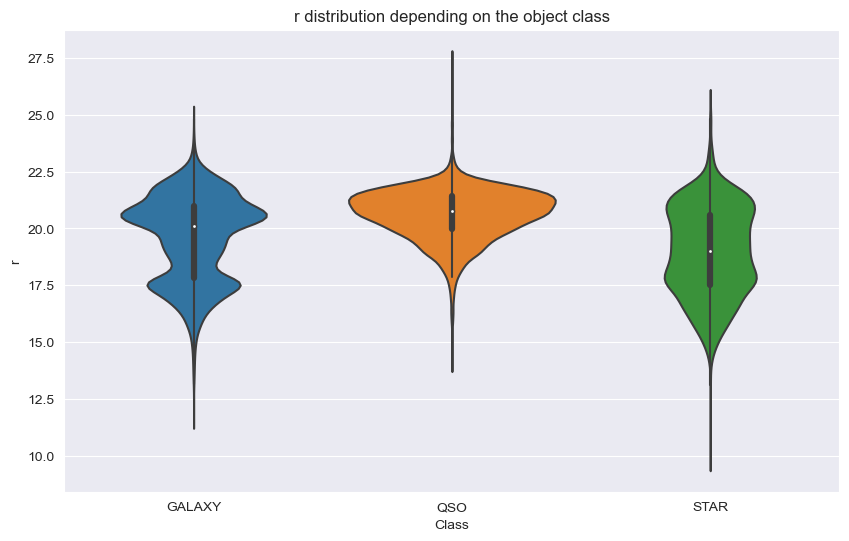

In [58]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "r", data = train_df)
plt.title("r distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("r")
plt.show()

Wyniki jak dla zespołu budowy.

#### Ad 3.6.8. rozkład i


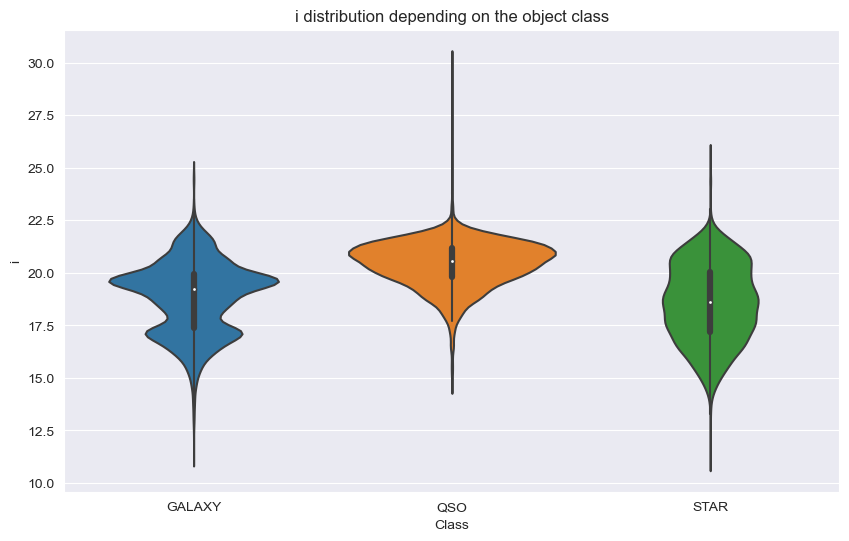

In [59]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "i", data = train_df)
plt.title("i distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("i")
plt.show()

Wykresy podobne jak dla zespołu budowy.

#### Ad 3.6.9. rozkład z


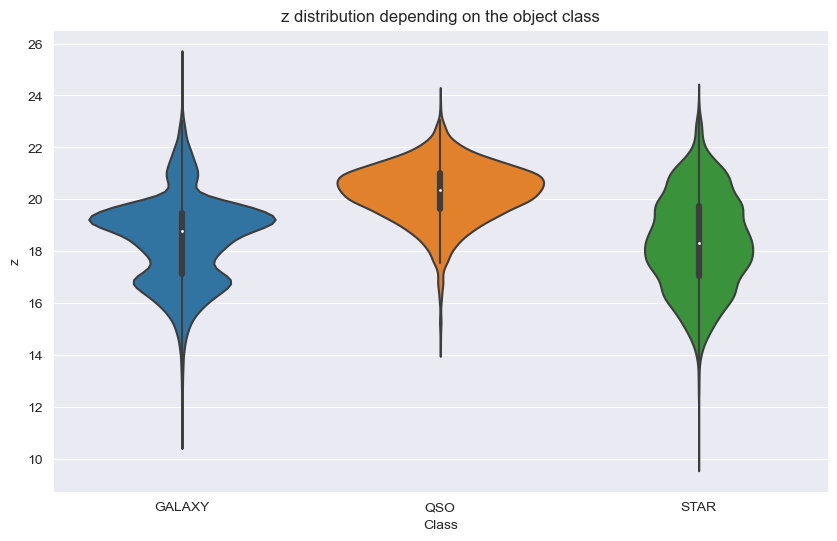

In [60]:
plt.figure(figsize = (10, 6))
sns.violinplot(x = "class", y = "z", data = train_df)
plt.title("z distribution depending on the object class")
plt.xlabel("Class")
plt.ylabel("z")
plt.show()

Jak wyżej.

#### Ad 3.6.10. Wnioski:
- *zmienne skorelowane (u, g, r, i, z) mają podobne rozkłady (jakoś bardzo nas to nie dziwi),*
- *wartość redshift może mieć *duże* znaczenie przy określaniu typu gwiazdozbioru,*
- *QSO ma dużo wartości u~=21, podczas gdy GALAXY ma ich bardzo mało.*

Z danych walidacyjnych można by wyciągnąć analogiczne wnioski.

### 3.7. zależność dwóch zmiennych numerycznych i klasy
#### Ad 3.7.1. wszystkie zmienne

C:\Users\pauli\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\pauli\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\pauli\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\pauli\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

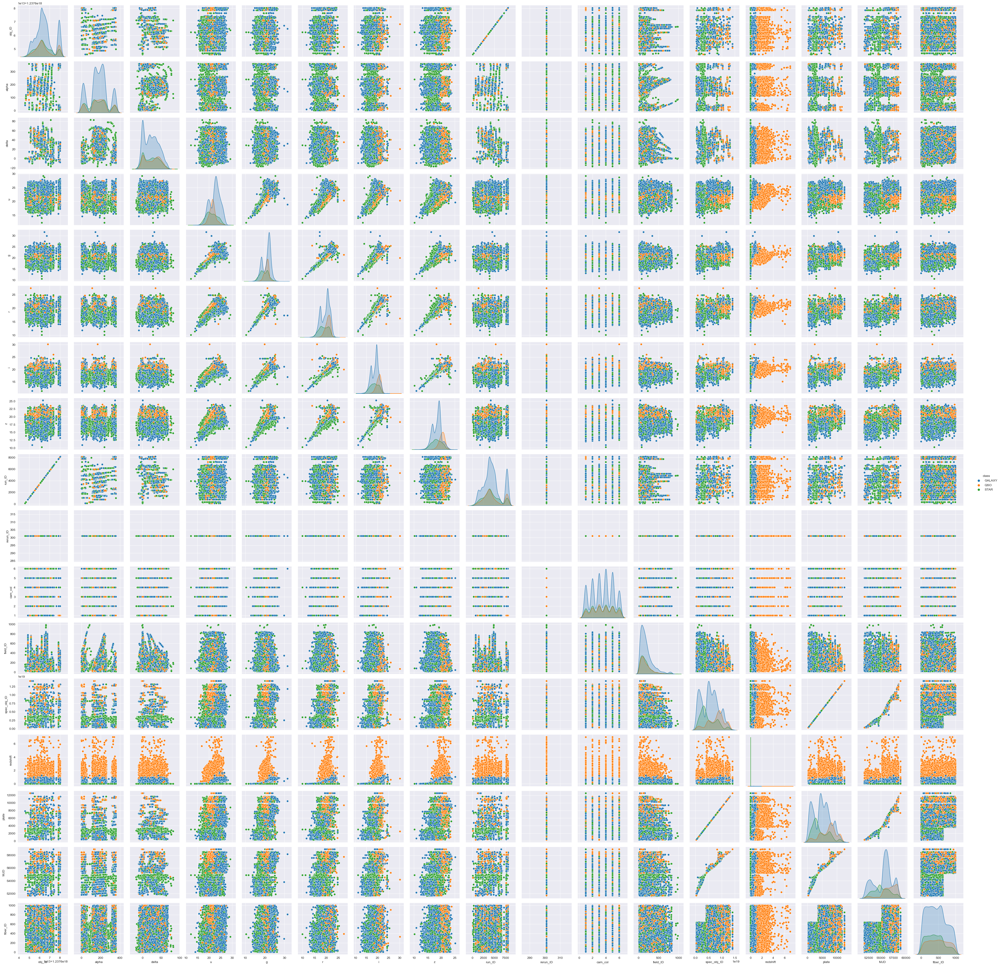

In [61]:
#sns.pairplot(train_df, hue='class')

Nie działa - czy dlatego zakomentowane?

#### Ad 3.7.2. zależność spec_obj_ID od u i klasy

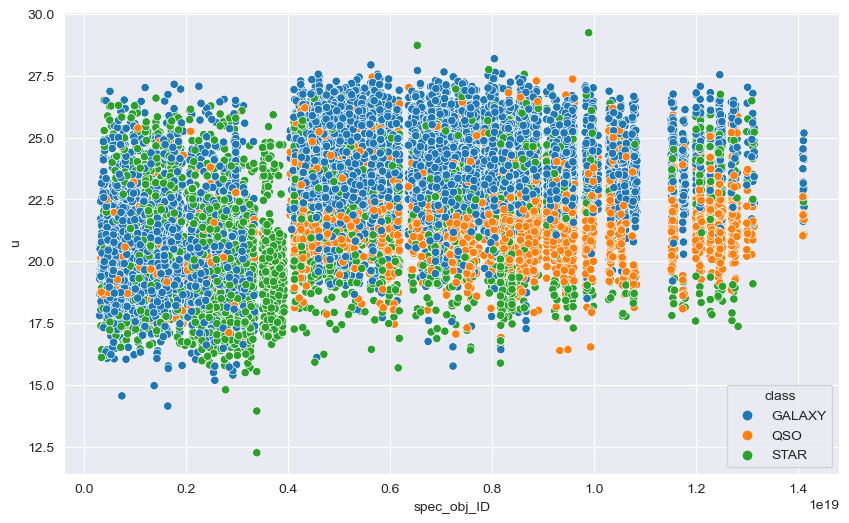

In [62]:
plt.figure(figsize = (10, 6))
sns.scatterplot(x = 'spec_obj_ID', y = 'u', data = train_df, hue = 'class')
plt.show()

*Na wykresie widać obszary zdominowane przez badane klasy gwiazdozbiorów.*
Dla danych walidacyjnych wyniki podobne.

#### 3.7.3. zależność spec_obj_ID od delta i klasy

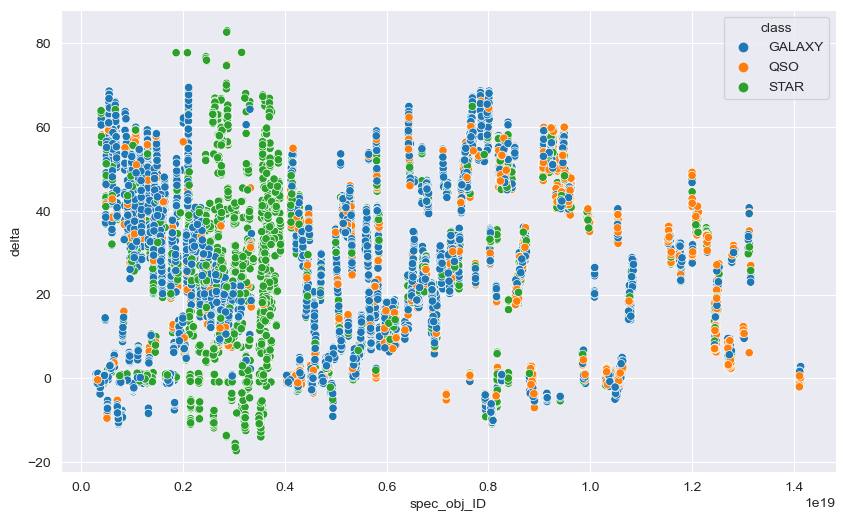

In [63]:
plt.figure(figsize = (10, 6))
sns.scatterplot(x = 'spec_obj_ID', y = 'delta', data = train_df, hue = 'class')
plt.show()

Dla danych walidacyjnych wyniki podobne.

### Ad 4. Wnioski z EDA
- *Klasa gwiazdy ma 3 możliwe wartości: STAR, GALAXY i QSO. Najpopularniejszą wartością jest więc GALAXY (59%), następnie QSO (22%) i STAR (19%). Dane nie są więc zbalansowane - w większości obserwacji klasą gwiazdy jest GALAXY.*
- *Kolumna spec_obj_ID ma bardzo duże znaczenie w zadaniu.*
- *Zmienne o nazwach [coś]_ID (z wyjątkiem sped_obj_ID) oraz cam_col nie mają znaczenia dla identyfikacji gwiazd.*
- *Zmienna redshift jest **bardzo istotna** przy określaniu klasy. Właściwie jednoznacznie określa klasę.*
- *Zmienna u może pomóc określić, czy badany obiekt jest klasy QSO czy GALAXY (QSO ma dużo wartości u~=21, podczas gdy GALAXY ma ich bardzo mało).*

Wnioski wydają się poprawne. W poleceniu była mowa o zbadaniu temperatury, magnitudy, prędkości radialnej - nie było zmiennych o takich nazwach. Czy jest jakiś związek, który można by zauważyć już na tym etapie?